# Introduction and Motivation

> In this project, we set out to produce predictions of future COVID-19 cases and deaths that would be useful for leaders in healthcare and government, as well individuals directly. The US federal government has not sought to coordinate action among public sector and private sector leaders, and we think that data could fill a gap in both public, private, and individual decision-making. 

> For hospital systems, predicting surges in cases would help with staffing decisions and equipment allocation decisions across counties and states. For government leaders at the local level, accurate predictions could help create more flexible public health responses that get put in place when they are needed and are backed up by data to justify possible economic consequences. For government leaders at the state and national level, predictions help allocate resources fairly and with agility. This kind of predictive data could easily be fed into a consumer-facing app that could empower individuals and nudge responsible decision making. For instance, if predictive data showed a likely jump in cases in your county, maybe you would hold off on a social gathering or skip your visit to the gym. 

> Typically, there is roughly a 14 day lag between the time of infection and the time an infection is reported, so we have decided to focus on predicting infection rates and death rates 14 days in advance, when they can optimally inform decision-making. However, the code is easily modified to predict farther into the future. We hope our insights improve efficient and fair resource allocation in response to COVID-19 cases and deaths. 




In [ ]:
%%capture
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import itertools
import seaborn as sn
import urllib.request
import requests
from urllib.request import urlopen
import plotly.express as px
from lxml import html
import io
import json

import calendar
import statsmodels.formula.api as smf
from scipy import stats
from matplotlib import dates

from datetime import datetime
from datetime import timedelta
from matplotlib.dates import DateFormatter
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, GroupKFold, GridSearchCV
from sklearn.utils.testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning, UndefinedMetricWarning
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [ ]:
pip install -U plotly

     |████████████████████████████████| 13.2MB 9.7MB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


# Part 1 - Data Wrangling
The full dataset contains six data sources:


*   Daily COVID-19 newly confirmed cases, death - by County
*   Demographic Features retrieved from ACS 2018 - by County
*   Daily Weather Data - Temperature - by County
*   State Regulations: Mask Regulation, Bar Regulation, School Regulation. Recoded as binary features - by State
*   Weekly Nursing Home Occupancy Rate - by County
*   Weekly Hospitalization Rate - by County

Each component above was connected through **FIPS code**, an unique 5-digit number that identifies each US county. After merging and cleaning, the full dataset contains 25 features, 700,000+ rows, covering time period from 2020-5-24 to 2020-11-28.








## 1. COVID-19 Cases/Fatality data

Daily COVID-19 confirmed cases and fatality data at US county level was retrieved from [New York Times](https://dj2taa9i652rf.cloudfront.net/) dataset storing in AWS S3 Explorer (*rearc-covid-19-nyt-data-in-usa* -> *csv* -> *us-counties*).

Operations include:


*   Change data types to **int** for columns *FIPS code, daily cases, daily death*.



In [ ]:
# read covid dataset
%%capture
!wget --no-check-certificate 'https://doc.google.com/uc?export=download&id=1ZTPbA9PD5Nkws6VujT7WAVmUo7Eot7L6' -O covid_us_counties.csv

covid_v = pd.read_csv("covid_us_counties.csv")

In [ ]:
# change column data type
cols = ['fips', 'cases', 'deaths']
for col in cols:
   covid_v[col] = covid_v[col].apply(lambda x: int(x) if x == x else "")

In [ ]:
covid_v.head()

,date,county,state,fips,cases,deaths
0,1/21/2020,Snohomish,Washington,53061,1,0
1,1/22/2020,Snohomish,Washington,53061,1,0
2,1/23/2020,Snohomish,Washington,53061,1,0
3,1/24/2020,Cook,Illinois,17031,1,0
4,1/24/2020,Snohomish,Washington,53061,1,0


## 2. Demographic features - American Community Survey 2018

To incorporate demographic features to our dataset, ACS 2018 (5-Year Estimates) data was retireved from Social Explorer. This is the most recent demographic data that Social Explorer offers by county.

Operations include:


*   **Rename** variables to readable format.
*   Combine **age groups** of variable *population*.
*   Generate **percentage** and replace absolute numbers for features: *population, race, education, unemployment, insurance*.
*   **Left join** COVID and ACS on **FIPS** code.

In [ ]:
# import ACS 2018 demographic data
%%capture
!wget --no-check-certificate 'https://doc.google.com/uc?export=download&id=1i_bD94rvdT4yuhs_EFqIU6V14nIyALOj' -O ACS2018.csv

ACS = pd.read_csv("ACS2018.csv")

In [ ]:
# rename variables
ACS.columns = ['FIPS', 'county', 'state', 
               'tot_pop', 'pop_den',
               'pop<5', 'pop5-9',
               'pop10-14','pop15-17',
               'pop18-24','pop25-34',
               'pop35-44','pop45-54',
               'pop55-64', 'pop65-74',
               'pop75-84',
               'pop>85', 'tot_pop2',
               'pop_white',
               'pop_black',
               'pop_asian', 'avg_household_size',
               'pop>25',
               '<high_school',
               'high_grad',
               'college',
               'bachelor',
               'master',
               'prof',
               'phd',
               'labor_pop',
               'employ',
               'unemploy',
               'med_income',
               'health_pop',
               'no_ins',
               'with_ins',
               'pub_ins',
               'pri_ins']

In [ ]:
# combine/convert variables
## age groups %, edu level %, employ %, ins %
ACS['young_per'] = (ACS['pop<5'] + ACS['pop5-9'] + ACS['pop10-14'] + ACS['pop15-17'] + ACS['pop18-24'])/ACS['tot_pop']*100
ACS['adult_per'] = (ACS['pop25-34'] + ACS['pop35-44'] + ACS['pop45-54'] + ACS['pop55-64'])/ACS['tot_pop']*100
ACS['elder_per'] = (ACS['pop65-74'] + ACS['pop75-84'] + ACS['pop>85'])/ACS['tot_pop']*100

ACS['white_per'] = ACS['pop_white']/ACS['tot_pop']*100
ACS['black_per'] = ACS['pop_black']/ACS['tot_pop']*100
ACS['asian_per'] = ACS['pop_asian']/ACS['tot_pop']*100

ACS['edu_bach'] = (ACS['bachelor'] + ACS['master'] + ACS['prof'] + ACS['phd'])/ACS['pop>25']*100

ACS['unemploy_rate'] = ACS['unemploy']/ACS['labor_pop']*100

ACS['ins_rate'] = ACS['with_ins']/ACS['health_pop']*100
ACS['pub_ins_rate'] = ACS['pub_ins']/ACS['with_ins']*100


In [ ]:
# drop variables
ACS = ACS[['FIPS', 'county', 'state', 'tot_pop', 'pop_den', 'young_per', 'elder_per', 'white_per', 'black_per', 'avg_household_size', 'edu_bach', 'med_income', 'unemploy_rate', 'ins_rate', 'pub_ins_rate']]
ACS.head()

,FIPS,county,state,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate
0,1001,Autauga County,al,55200,92.85992,32.670290,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822
1,1003,Baldwin County,al,208107,130.90190,29.368546,19.540429,86.266200,9.497038,2.61,31.345883,55962.0,4.444240,89.844830,39.180228
2,1005,Barbour County,al,25782,29.13214,29.512838,17.973780,47.381894,47.575828,2.49,12.215925,34186.0,9.524798,88.820907,56.622712
3,1007,Bibb County,al,22527,36.19020,29.950726,16.251609,76.654681,22.275492,2.99,11.489227,45340.0,7.513989,92.090092,41.105629
4,1009,Blount County,al,57645,89.39555,31.256831,17.751756,95.505248,1.495360,2.77,12.642895,48695.0,4.084475,88.974794,38.831439


In [ ]:
# left join covid and ACS on FIPS code
covid = covid_v.merge(ACS, left_on= 'fips', right_on= 'FIPS', how = 'left')
covid = covid.drop(['FIPS', 'county_y', 'state_y'], axis=1)
covid = covid.rename(columns={"county_x": "county", "state_x": "state"})
covid['date'] = pd.to_datetime(covid['date'],format="%m/%d/%Y")
covid.head()

,date,county,state,fips,cases,deaths,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate
0,2020-01-21,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081
1,2020-01-22,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081
2,2020-01-23,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081
3,2020-01-24,Cook,Illinois,17031,1,0,5223719.0,5528.1240,31.331892,13.873832,56.617919,23.555900,2.61,37.969417,62088.0,7.772987,90.491986,38.403881
4,2020-01-24,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081


## 3. Weather data

Daily temperature by county was acquired and processed in a separate [notebook](https://colab.research.google.com/drive/1PR2_3jbzl0FIpko38EtZ4SN9cW5J02Hq?usp=sharing). The notebook functioned as acquiring daily weather data in the time period of COVID-19 pandemic at US county level through **World Weather Online** API key, inspired by this [blog post](https://towardsdatascience.com/obtain-historical-weather-forecast-data-in-csv-format-using-python-5a6c090fc828). 

Operations include:


*   Read pre-processed weather data
*   Change data types of *FIPS code* and *date*.



In [ ]:
# acquire weather data
%%capture
!wget --no-check-certificate 'https://doc.google.com/uc?export=download&id=1plzut2ifHGa67480D2OfUdxyLDnmtHgB' -O county_weather.csv

In [ ]:
# Import weather dataset
weather = pd.read_csv("county_weather.csv")
weather['FIPS'] = weather['FIPS'].apply(lambda x: int(x) if x == x else "")
weather['date_time'] = pd.to_datetime(weather['date_time'],format="%Y-%m-%d")
weather = weather.drop(['Unnamed: 0'], axis=1)
weather.head()

,date_time,COUNTY,STATE,FIPS,tempC
0,2020-01-20,Saline County,NE,31151,-13.0
1,2020-01-20,Seward County,NE,31159,-13.0
2,2020-01-21,Saline County,NE,31151,-4.0
3,2020-01-21,Seward County,NE,31159,-4.0
4,2020-01-22,Saline County,NE,31151,2.0


In [ ]:
# left join covid with county_weather on date & fips
covid = pd.merge(covid, weather,  how='left', left_on=['date','fips'], right_on = ['date_time','FIPS'])
covid = covid.drop(['date_time', 'COUNTY', 'STATE', 'FIPS'], axis=1)
covid.head()

,date,county,state,fips,cases,deaths,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate,tempC
0,2020-01-21,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081,7.0
1,2020-01-22,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081,6.0
2,2020-01-23,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081,11.0
3,2020-01-24,Cook,Illinois,17031,1,0,5223719.0,5528.1240,31.331892,13.873832,56.617919,23.555900,2.61,37.969417,62088.0,7.772987,90.491986,38.403881,2.0
4,2020-01-24,Snohomish,Washington,53061,1,0,786620.0,377.0012,31.021078,12.695838,76.336732,2.875976,2.68,31.865345,82751.0,4.565260,93.545746,30.364081,10.0


In [ ]:
len(covid)

777720

## 4. State Regulations

This [Github repository](https://github.com/COVID19StatePolicy/SocialDistancing/tree/master/data) contains state level restrictions summary due to COVID-19. The summary covers restrictions for businesses and schools, as well as sanitation protocols, presenting in daily level.

Among all restrictions, three were encoded as **binary** features and merged to our main dataset: **mask, school and bar regulations**.  

Operations include:


*   Read csv file from Github repository
*   Extract each restriction and keep only three columns: *restriction name, enact date, end date*.
*   Convert wide format to long format (concat *enact date* and *end date* for each county/date)
*   Encode *enact date* as 1, *end date* as 0.
*   Fill out sequential cells with 1 and 0.



In [ ]:
# import state regulation summary table from Github repository
reg = pd.read_csv("https://raw.githubusercontent.com/COVID19StatePolicy/SocialDistancing/master/data/USstatesCov19distancingpolicy.csv", encoding ='latin1')

reg['DateEnded'] = np.where(reg['DateEnded'].isnull(), reg['DateExpiry'], reg['DateEnded'])

date_list = ['DateEnacted', 'DateExpiry', 'DateEnded']
for date in date_list:
    reg[date] = pd.to_datetime(reg[date],format="%Y%m%d")

reg.head()

,location_id,StateFIPS,StatePostal,StateName,StatePolicy,Mandate,StateWide,Curfew,CurfewStart,CurfewEnd,InGathLim,OutGathLim,InGathLimReligious,OutGathLimReligious,BusinessRestrictLevel,SchoolRestrictLevel,PublicMaskLevel,DateIssued,DateEnacted,DateExpiry,DateEased,DateEnded,DateReexpanded1,DateReeased1,PolicyCodingNotes,PolicySource,LastUpdated,LastUpdatedNotes,ReReviewed
0,523.0,1.0,AL,Alabama,EmergDec,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20200313.0,2020-03-13,2021-03-08,NaN,2021-03-08,NaN,NaN,"Public Health Emergency declared. On 20200702,...",https://governor.alabama.gov/newsroom/2020/03/...,20201211.0,Updated DateExpiry to 20210308 and PolicyCodin...,0.0
1,523.0,1.0,AL,Alabama,SchoolClose,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20200314.0,2020-03-18,2020-08-31,20200601.0,2020-06-26,NaN,NaN,In effect 20200318. 20200319 issuance also clo...,http://alabamapublichealth.gov/legal/assets/42...,20200819.0,Added DateEnded,0.0
2,523.0,1.0,AL,Alabama,GathRestrict,1.0,0.0,0.0,NaN,NaN,25.0,25.0,25.0,25.0,NaN,NaN,NaN,20200317.0,2020-03-17,NaT,NaN,NaT,NaN,NaN,Public health order for prohibiting gathering ...,https://www.alabamapublichealth.gov/legal/asse...,20200804.0,NaN,0.0
3,523.0,1.0,AL,Alabama,BarRestrict,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20200319.0,2020-03-19,2021-01-22,20200511.0,2021-01-22,NaN,NaN,Limited operations required: bars and brewerie...,https://governor.alabama.gov/assets/2020/03/Al...,20201211.0,Updated DateExpiry to 20200122 and PolicyCodin...,0.0
4,523.0,1.0,AL,Alabama,GathRestrict,1.0,1.0,0.0,NaN,NaN,25.0,25.0,25.0,25.0,NaN,NaN,NaN,20200319.0,2020-03-19,NaT,NaN,NaT,NaN,NaN,"In effect as of 5 pm 20200319. On 20200320, am...",https://governor.alabama.gov/assets/2020/03/Al...,20200803.0,Updated entry to new gathering system and adde...,0.0


In [ ]:
# Regulation1: 'PublicMask'
reg_mask = reg[reg['StatePolicy']== 'PublicMask'][['StateName', 'DateEnacted', 'DateEnded']]
reg_mask

,StateName,DateEnacted,DateEnded
11,Alabama,2020-04-30,2020-07-31
14,Alabama,2020-07-16,2021-01-22
28,Alaska,2020-04-03,NaT
29,Alaska,2020-04-24,2020-05-22
35,Alaska,2020-07-22,NaT
...,...,...,...
1295,West Virginia,2020-07-07,NaT
1317,Wisconsin,2020-05-28,NaT
1319,Wisconsin,2020-08-01,2021-01-19
1335,Wyoming,2020-04-06,NaT


In [ ]:
# convert wide to long, binary
reg_mask_start = reg_mask[['StateName', 'DateEnacted']]
reg_mask_start['reg_mask'] = 1
reg_mask_start = reg_mask_start.rename(columns={"DateEnacted": "date", "StateName": "state"})

reg_mask_end = reg_mask[['StateName', 'DateEnded']]
reg_mask_end['reg_mask'] = 0
reg_mask_end = reg_mask_end.rename(columns={"DateEnded": "date", "StateName": "state"})
reg_mask_end

reg_mask_lg = pd.concat([reg_mask_start, reg_mask_end])
reg_mask_lg

,state,date,reg_mask
11,Alabama,2020-04-30,1
14,Alabama,2020-07-16,1
28,Alaska,2020-04-03,1
29,Alaska,2020-04-24,1
35,Alaska,2020-07-22,1
...,...,...,...
1295,West Virginia,NaT,0
1317,Wisconsin,NaT,0
1319,Wisconsin,2021-01-19,0
1335,Wyoming,NaT,0


In [ ]:
# left join covid with reg on state
covid = pd.merge(covid, reg_mask_lg,  how='left', left_on=['state', 'date'], right_on = ['state', 'date'])

In [ ]:
# fill reg with 1 and 0
covid.sort_values(by=['state', 'county', 'date'], inplace=True)
covid = covid.ffill()
covid = covid.fillna(0)

In [ ]:
# Regulation2: 'BarRestrict'
reg_bar = reg[reg['StatePolicy']== 'BarRestrict'][['StateName', 'DateEnacted', 'DateEnded']]
reg_bar

,StateName,DateEnacted,DateEnded
3,Alabama,2020-03-19,2021-01-22
18,Alaska,2020-03-18,2020-05-22
39,Arizona,2020-03-20,NaT
42,Arizona,2020-03-31,2020-05-16
55,Arizona,2020-06-29,NaT
...,...,...,...
1309,Wisconsin,2020-03-20,2020-05-13
1320,Wisconsin,2020-10-08,2020-10-23
1328,Wyoming,2020-03-19,2020-05-16
1338,Wyoming,2020-05-15,2020-12-16


In [ ]:
# convert wide to long, binary
reg_bar_start = reg_bar[['StateName', 'DateEnacted']]
reg_bar_start['reg_bar'] = 1
reg_bar_start = reg_bar_start.rename(columns={"DateEnacted": "date", "StateName": "state"})

reg_bar_end = reg_bar[['StateName', 'DateEnded']]
reg_bar_end['reg_bar'] = 0
reg_bar_end = reg_bar_end.rename(columns={"DateEnded": "date", "StateName": "state"})
reg_bar_end

reg_bar_lg = pd.concat([reg_bar_start, reg_bar_end])
reg_bar_lg

,state,date,reg_bar
3,Alabama,2020-03-19,1
18,Alaska,2020-03-18,1
39,Arizona,2020-03-20,1
42,Arizona,2020-03-31,1
55,Arizona,2020-06-29,1
...,...,...,...
1309,Wisconsin,2020-05-13,0
1320,Wisconsin,2020-10-23,0
1328,Wyoming,2020-05-16,0
1338,Wyoming,2020-12-16,0


In [ ]:
# left join covid with reg on state
covid = pd.merge(covid, reg_bar_lg,  how='left', left_on=['state', 'date'], right_on = ['state', 'date'])

In [ ]:
# fill reg with 1 and 0
covid.sort_values(by=['state', 'county', 'date'], inplace=True)
covid = covid.ffill()
covid = covid.fillna(0)

In [ ]:
# Regulation3: 'SchoolClose'
reg_school = reg[reg['StatePolicy']== 'SchoolClose'][['StateName', 'DateEnacted', 'DateEnded']]
reg_school

,StateName,DateEnacted,DateEnded
1,Alabama,2020-03-18,2020-06-26
16,Alaska,2020-03-16,2020-07-27
38,Arizona,2020-03-16,2020-08-17
66,Arkansas,2020-03-17,2020-08-24
80,California,2020-03-13,NaT
...,...,...,...
1278,West Virginia,2020-03-14,NaT
1287,West Virginia,2020-03-24,2020-07-24
1302,Wisconsin,2020-03-18,2020-06-22
1331,Wyoming,2020-03-19,2020-05-18


In [ ]:
# convert wide to long, binary
reg_school_start = reg_school[['StateName', 'DateEnacted']]
reg_school_start['reg_school'] = 1
reg_school_start = reg_school_start.rename(columns={"DateEnacted": "date", "StateName": "state"})

reg_school_end = reg_school[['StateName', 'DateEnded']]
reg_school_end['reg_school'] = 0
reg_school_end = reg_school_end.rename(columns={"DateEnded": "date", "StateName": "state"})
reg_school_end

reg_school_lg = pd.concat([reg_school_start, reg_school_end])
reg_school_lg

,state,date,reg_school
1,Alabama,2020-03-18,1
16,Alaska,2020-03-16,1
38,Arizona,2020-03-16,1
66,Arkansas,2020-03-17,1
80,California,2020-03-13,1
...,...,...,...
1278,West Virginia,NaT,0
1287,West Virginia,2020-07-24,0
1302,Wisconsin,2020-06-22,0
1331,Wyoming,2020-05-18,0


In [ ]:
# left join covid with reg on state
covid = pd.merge(covid, reg_school_lg,  how='left', left_on=['state', 'date'], right_on = ['state', 'date'])

In [ ]:
# fill reg with 1 and 0
covid.sort_values(by=['state', 'county', 'date'], inplace=True)
covid = covid.ffill()
covid = covid.fillna(0)

In [ ]:
covid.head()

,date,county,state,fips,cases,deaths,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate,tempC,reg_mask,reg_bar,reg_school
0,2020-03-24,Autauga,Alabama,1001,1,0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,26.0,0.0,0.0,0.0
1,2020-03-25,Autauga,Alabama,1001,4,0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,25.0,0.0,0.0,0.0
2,2020-03-26,Autauga,Alabama,1001,6,0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,28.0,0.0,0.0,0.0
3,2020-03-27,Autauga,Alabama,1001,6,0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,29.0,0.0,0.0,0.0
4,2020-03-28,Autauga,Alabama,1001,6,0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,30.0,0.0,0.0,0.0


## 5. Feature Engineering and Creating Rolling Averages

Here, we manipulated a number of features to improve data for modeling. Adding infection rate and death rate allowed us to take into account differing population levels. The two columns "2week_infect_rate_predict" and "2week_death_rate_predict" are the two **target variables** for prediction in modeling. They are created by shifting infection rate by two weeks. 

Predicting infection rates and death rates two weeks in the future is a useful target for policymakers and Americans who hope to understand what is happening in their county far enough in advance to shift resources, change their personal behavior, and enact adaptable public health measures.

We also introduce **14-day rolling averages** of infection and death rates, which is a fundamental method for analyzing time series data. Not only does this help us analyze time dependence and improve data visualizations, but it also smooths any data irregularities. 

There are a number of issues relating to inconsistent data reporting with COVID-19 data. These include uneven reporting over the course of the week, due to the realities of uneven testing, uneven test processing in labs, and uneven data processing by relevant authorities, as well as reporting disruptions due to holidays or overwhelmed capacity. 

In sum, the rolling averages help us improve the data and build in a small degree of time dependence, without introducing the complexity of autocorrelation models.


In [ ]:
# Create infection rate and death rate columns and produce a numeric date column, 
# which gives us a better idea of differences across counties
covid['deaths'] = pd.to_numeric(covid['deaths'])
covid['infect_rate'] = covid['cases']/covid['tot_pop']
covid['death_rate'] = covid['deaths']/covid['tot_pop']
covid['date_num'] = (covid['date'] - covid['date'].min()).dt.days
covid.drop(columns=['cases','deaths'])

,date,county,state,fips,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate,tempC,reg_mask,reg_bar,reg_school,infect_rate,death_rate,date_num
0,2020-03-24,Autauga,Alabama,1001,55200.0,92.859920,32.670290,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,26.0,0.0,0.0,0.0,0.000018,0.000000,63
1,2020-03-25,Autauga,Alabama,1001,55200.0,92.859920,32.670290,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,25.0,0.0,0.0,0.0,0.000072,0.000000,64
2,2020-03-26,Autauga,Alabama,1001,55200.0,92.859920,32.670290,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,28.0,0.0,0.0,0.0,0.000109,0.000000,65
3,2020-03-27,Autauga,Alabama,1001,55200.0,92.859920,32.670290,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,29.0,0.0,0.0,0.0,0.000109,0.000000,66
4,2020-03-28,Autauga,Alabama,1001,55200.0,92.859920,32.670290,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,30.0,0.0,0.0,0.0,0.000109,0.000000,67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779328,2020-11-24,Weston,Wyoming,56045,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.20,19.166334,52867.0,3.540091,86.674581,35.576100,2.0,1.0,0.0,0.0,0.053944,0.000141,308
779329,2020-11-25,Weston,Wyoming,56045,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.20,19.166334,52867.0,3.540091,86.674581,35.576100,4.0,1.0,0.0,0.0,0.054366,0.000141,309
779330,2020-11-26,Weston,Wyoming,56045,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.20,19.166334,52867.0,3.540091,86.674581,35.576100,1.0,1.0,0.0,0.0,0.054366,0.000141,310
779331,2020-11-27,Weston,Wyoming,56045,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.20,19.166334,52867.0,3.540091,86.674581,35.576100,5.0,1.0,0.0,0.0,0.055775,0.000141,311


In [ ]:
# Initialize rolling averages of infection rate and death rate column in the main dataframe
covid['rolling_infect_mean'] = np.nan
covid['rolling_death_mean'] = np.nan
# Initialize target variables in the main dataframe
covid['2week_infect_rate_predict'] = np.nan
covid['2week_death_rate_predict'] = np.nan

# Produce a list of unique county, state combinations, which will be used to produce 
# rolling averages and target variables separately for each county
unique_places = covid.loc[:,['county','state']].drop_duplicates()

In [ ]:
unique_places.head()

,county,state
0,Autauga,Alabama
250,Baldwin,Alabama
510,Barbour,Alabama
750,Bibb,Alabama
994,Blount,Alabama


In [ ]:
# A for loop is used because some counties are missing data 
for c, s in zip(unique_places['county'], unique_places['state']):
    # Filter by county and state
    temp = covid[(covid.county==c) & (covid.state==s)]
    # Select columns of interest
    temp = temp.loc[:,['county','state','infect_rate','death_rate','date_num']]
    # Create columns with rolling averages
    new_infect_col = temp['infect_rate'].rolling(window=7).mean()
    new_death_col = temp['death_rate'].rolling(window=7).mean()
    # Add these columns to the main dataframe
    covid.loc[(covid.county==c) & (covid.state==s),'rolling_infect_mean'] = new_infect_col.values
    covid.loc[(covid.county==c) & (covid.state==s),'rolling_death_mean'] = new_death_col.values
    # Initialize columns for target variables
    new_2wk_infect_col = np.zeros(temp.shape[0]) * np.nan
    new_2wk_death_col = np.zeros(temp.shape[0]) * np.nan
    # Change the values of target varibles by shifting data 2 weeks ahead
    new_2wk_infect_col[:-14] = temp.iloc[14:,2]
    new_2wk_death_col[:-14] = temp.iloc[14:,3] 
    # Add these target variable volumns to the main dataframe
    covid.loc[(covid.county==c) & (covid.state==s),'2week_infect_rate_predict'] = new_2wk_infect_col
    covid.loc[(covid.county==c) & (covid.state==s),'2week_death_rate_predict'] = new_2wk_death_col

Based on how the infection rates and death rates 2 weeks in the future were calculated, we can expect that the last 14 days of data for each county will have NaN values, because we do not have values 14 days in the future. We will need to drop these rows.

In [ ]:
covid[-15:]

,date,county,state,fips,cases,deaths,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate,tempC,reg_mask,reg_bar,reg_school,infect_rate,death_rate,date_num,rolling_infect_mean,rolling_death_mean,2week_infect_rate_predict,2week_death_rate_predict
779318,2020-11-14,Weston,Wyoming,56045,336,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,-1.0,1.0,0.0,0.0,0.047324,0.000000,298,0.045211,0.000000,0.055775,0.000141
779319,2020-11-15,Weston,Wyoming,56045,339,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,3.0,1.0,0.0,0.0,0.047746,0.000000,299,0.045875,0.000000,NaN,NaN
779320,2020-11-16,Weston,Wyoming,56045,338,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,4.0,1.0,0.0,0.0,0.047606,0.000000,300,0.046439,0.000000,NaN,NaN
779321,2020-11-17,Weston,Wyoming,56045,346,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,11.0,1.0,0.0,0.0,0.048732,0.000000,301,0.046942,0.000000,NaN,NaN
779322,2020-11-18,Weston,Wyoming,56045,353,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,13.0,1.0,0.0,0.0,0.049718,0.000000,302,0.047545,0.000000,NaN,NaN
779323,2020-11-19,Weston,Wyoming,56045,355,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,7.0,1.0,0.0,0.0,0.050000,0.000000,303,0.048229,0.000000,NaN,NaN
779324,2020-11-20,Weston,Wyoming,56045,364,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,2.0,1.0,0.0,0.0,0.051268,0.000000,304,0.048913,0.000000,NaN,NaN
779325,2020-11-21,Weston,Wyoming,56045,366,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,3.0,1.0,0.0,0.0,0.051549,0.000000,305,0.049517,0.000000,NaN,NaN
779326,2020-11-22,Weston,Wyoming,56045,372,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,3.0,1.0,0.0,0.0,0.052394,0.000000,306,0.050181,0.000000,NaN,NaN
779327,2020-11-23,Weston,Wyoming,56045,372,1.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,5.0,1.0,0.0,0.0,0.052394,0.000141,307,0.050865,0.000020,NaN,NaN


In [ ]:
covid = covid.dropna()
covid[-15:]

,date,county,state,fips,cases,deaths,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate,tempC,reg_mask,reg_bar,reg_school,infect_rate,death_rate,date_num,rolling_infect_mean,rolling_death_mean,2week_infect_rate_predict,2week_death_rate_predict
779304,2020-10-31,Weston,Wyoming,56045,163,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,4.0,1.0,0.0,0.0,0.022958,0.000000,284,0.020584,0.00000,0.047324,0.000000
779305,2020-11-01,Weston,Wyoming,56045,164,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,10.0,1.0,0.0,0.0,0.023099,0.000000,285,0.021328,0.00000,0.047746,0.000000
779306,2020-11-02,Weston,Wyoming,56045,169,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,17.0,1.0,0.0,0.0,0.023803,0.000000,286,0.022072,0.00000,0.047606,0.000000
779307,2020-11-03,Weston,Wyoming,56045,181,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,19.0,1.0,0.0,0.0,0.025493,0.000000,287,0.022918,0.00000,0.048732,0.000000
779308,2020-11-04,Weston,Wyoming,56045,189,1.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,19.0,1.0,0.0,0.0,0.026620,0.000141,288,0.023742,0.00002,0.049718,0.000000
779309,2020-11-05,Weston,Wyoming,56045,203,1.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,16.0,1.0,0.0,0.0,0.028592,0.000141,289,0.024708,0.00004,0.050000,0.000000
779310,2020-11-06,Weston,Wyoming,56045,294,1.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,19.0,1.0,0.0,0.0,0.041408,0.000141,290,0.027425,0.00006,0.051268,0.000000
779311,2020-11-07,Weston,Wyoming,56045,296,1.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,18.0,1.0,0.0,0.0,0.041690,0.000141,291,0.030101,0.00008,0.051549,0.000000
779312,2020-11-08,Weston,Wyoming,56045,306,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,5.0,1.0,0.0,0.0,0.043099,0.000000,292,0.032958,0.00008,0.052394,0.000000
779313,2020-11-09,Weston,Wyoming,56045,310,0.0,7100.0,2.960794,29.380282,18.873239,92.535211,0.507042,2.2,19.166334,52867.0,3.540091,86.674581,35.5761,-3.0,1.0,0.0,0.0,0.043662,0.000000,293,0.035795,0.00008,0.052394,0.000141


Great! It looks like our data is in the form we want for modeling. Some visualizations will help us better understand these new columns. Let's look at a few randomly selected counties.

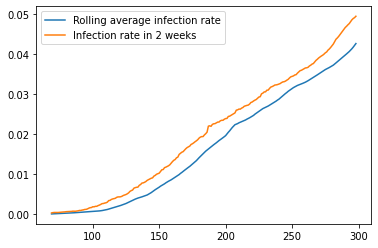

In [ ]:
autauga = covid[(covid.county=="Autauga") & (covid.state=="Alabama")]
plt.plot(autauga.date_num, autauga.rolling_infect_mean)
plt.plot(autauga.date_num, autauga['2week_infect_rate_predict'])
plt.legend(['Rolling average infection rate','Infection rate in 2 weeks'])
plt.show()

The infection rate in 2 weeks tracks the rolling average infection rate, but is higher. This is roughly what we might expect, given the growth rate of COVID-19 over time. 

## 6. Nursing Home Occupancy Rate

Nursing home **available beds** and **hospitalization status** were retrieved from a federal government [website](https://data.cms.gov/Special-Programs-Initiatives-COVID-19-Nursing-Home/COVID-19-Nursing-Home-Dataset/s2uc-8wxp) managed by the Centers for Medicare & Medicaid Services. 

Raw dataset was acquired and processed in a separate [notebook](https://colab.research.google.com/drive/1Akm6UJwdbpYObz3SICbN6pR-bQBcnNjU?usp=sharing).


In [ ]:
%%capture
!wget --no-check-certificate 'https://doc.google.com/uc?export=download&id=1--zpr_2NKlTFT2OS8MCFK0mv99lk17Ot' -O nh.csv

In [ ]:
nh = pd.read_csv("nh.csv")
nh = nh[['week_ending', 'provider_state',	'COUNTYNAME', 'STCOUNTYFP', 'number_of_all_beds',	'total_number_of_occupied']]
nh['week_ending'] = pd.to_datetime(nh['week_ending'],infer_datetime_format=True)

In [ ]:
nh = nh.groupby(['week_ending', 'provider_state',	'COUNTYNAME', 'STCOUNTYFP'])['number_of_all_beds', 'total_number_of_occupied'].sum().reset_index()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [ ]:
nh['occupy_rate'] = nh['total_number_of_occupied']/nh['number_of_all_beds']

## 7. Hospital Occupancy Level by County - Weekly Updated

Raw dataset was acquired and processed in a separate [notebook](https://colab.research.google.com/drive/1Akm6UJwdbpYObz3SICbN6pR-bQBcnNjU?usp=sharing).

In [ ]:
%%capture
!wget --no-check-certificate 'https://doc.google.com/uc?export=download&id=1e4LTWz5SviQC6mfJfwqZPTon3qtn1F4M' -O county_hosp.csv

In [ ]:
county_hosp = pd.read_csv("county_hosp.csv")
county_hosp['date'] = pd.to_datetime(county_hosp['date'],infer_datetime_format=True)
county_hosp

,Unnamed: 0,date,State,County Name,fips_code,Licensed All Beds,All Bed Occupancy Rate
0,1,2020-11-27,AK,Anchorage,2020,1149.0,0.66
1,2,2020-11-27,AK,Bethel,2050,37.0,0.40
2,3,2020-11-27,AK,Dillingham,2070,18.0,0.15
3,4,2020-11-27,AK,Fairbanks North Star,2090,175.0,0.46
4,5,2020-11-27,AK,Juneau,2110,73.0,0.41
...,...,...,...,...,...,...,...
39350,2532,2020-06-21,WY,Sweetwater,56037,115.0,0.25
39351,2533,2020-06-21,WY,Teton,56039,48.0,0.36
39352,2534,2020-06-21,WY,Uinta,56041,225.0,0.58
39353,2535,2020-06-21,WY,Washakie,56043,18.0,0.29


## 8. Merge Datasets

### 8.1 Daily Nursing Home Occupancy Rate

In [ ]:
# inner join covid and nh, on fips and date
nh_daily = pd.merge(covid, nh, left_on=['date','fips'], right_on=['week_ending','STCOUNTYFP'], how = 'left').ffill().dropna().drop(columns=['week_ending',	'provider_state',	'COUNTYNAME',	'STCOUNTYFP']).reset_index(drop=True)
nh_daily.head()

,date,county,state,fips,cases,deaths,tot_pop,pop_den,young_per,elder_per,white_per,black_per,avg_household_size,edu_bach,med_income,unemploy_rate,ins_rate,pub_ins_rate,tempC,reg_mask,reg_bar,reg_school,infect_rate,death_rate,date_num,rolling_infect_mean,rolling_death_mean,2week_infect_rate_predict,2week_death_rate_predict,number_of_all_beds,total_number_of_occupied,occupy_rate
0,2020-05-24,Autauga,Alabama,1001,159,3.0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,32.0,1.0,0.0,0.0,0.002880,0.000054,124,0.002570,0.000060,0.004819,0.000091,398.0,329.0,0.826633
1,2020-05-25,Autauga,Alabama,1001,168,3.0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,30.0,1.0,0.0,0.0,0.003043,0.000054,125,0.002694,0.000057,0.004946,0.000091,398.0,329.0,0.826633
2,2020-05-26,Autauga,Alabama,1001,189,3.0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,22.0,1.0,0.0,0.0,0.003424,0.000054,126,0.002855,0.000054,0.005127,0.000091,398.0,329.0,0.826633
3,2020-05-27,Autauga,Alabama,1001,192,3.0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,27.0,1.0,0.0,0.0,0.003478,0.000054,127,0.002999,0.000054,0.005362,0.000109,398.0,329.0,0.826633
4,2020-05-28,Autauga,Alabama,1001,205,3.0,55200.0,92.85992,32.67029,14.583333,76.878623,19.139493,2.59,27.689286,58786.0,4.228036,92.860696,36.091822,30.0,1.0,0.0,0.0,0.003714,0.000054,128,0.003150,0.000054,0.005725,0.000109,398.0,329.0,0.826633


In [ ]:
nh_daily.shape

(699231, 32)

### 8.2 Daily Hospital Occupancy Rate and Capacity

In [ ]:
hosp_daily = pd.merge(nh_daily, county_hosp, left_on=['date','fips'], right_on=['date','fips_code'], how = 'left').ffill().dropna().drop(columns=['Unnamed: 0',	'State',	'County Name']).reset_index(drop=True)
hosp_daily = hosp_daily.drop(columns = ['fips','fips_code'])
hosp_daily.rename(columns={'number_of_all_beds':'nh_beds','total_number_of_occupied':'nh_occ_beds','occupy_rate':'nh_occ_rate','Licensed All Beds':'hosp_beds','All Bed Occupancy Rate': 'hosp_occ_rate'},inplace=True)
hosp_daily['beds_per_person'] = hosp_daily['hosp_beds']/hosp_daily['tot_pop']
hosp_daily = hosp_daily.dropna()

Finally, let's drop any columns that we don't need after feature engineering.

##9. Exporting Data to Drive

The data wrangling section needs to run for about 20-30 minutes, so we have an option to export the final dataframe to a CSV in Google Drive, which we can then use for EDA and modeling without rerunning the portion of the notebook above.

In [ ]:
from google.colab import drive
drive.mount('drive')

Drive already mounted at drive; to attempt to forcibly remount, call drive.mount("drive", force_remount=True).


In [ ]:
hosp_daily.to_csv('covid.csv')
!cp covid.csv "drive/My Drive/"

# Part 2 - Exploratory Data Analysis



In [ ]:
# visualization 1 - plot of outcome varaible
# trend of occupy_rate by county/state across time
import altair as alt
from altair import datum
from vega_datasets import data

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [ ]:
from google.colab import drive
drive.mount('drive')

Mounted at drive


In [ ]:
import pandas as pd
hosp_daily = pd.read_csv('drive/My Drive/covid.csv')

One of the most surprising findings was that hospital occupancy rate did not change much over time, even as infection rates increased. Scroll down below to see the relationship week-by-week.

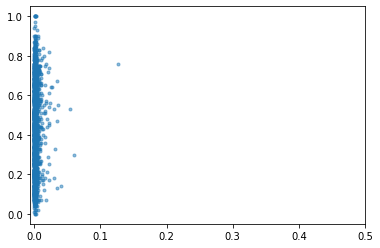

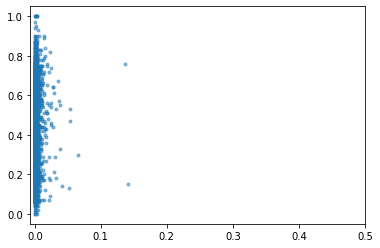

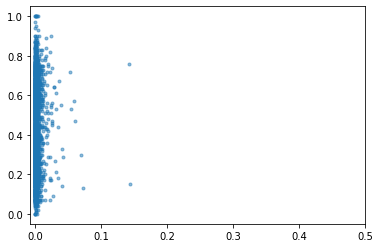

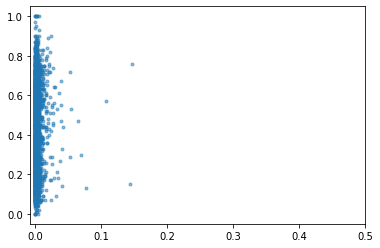

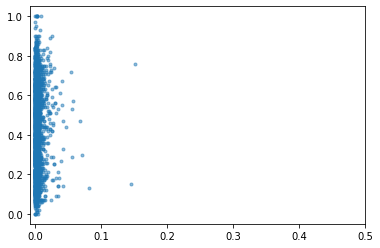

...

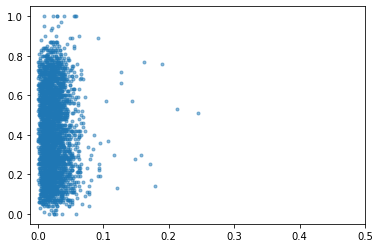

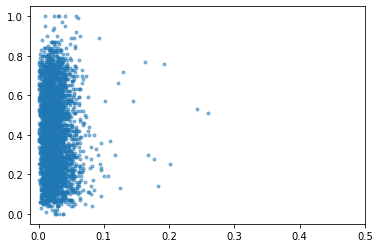

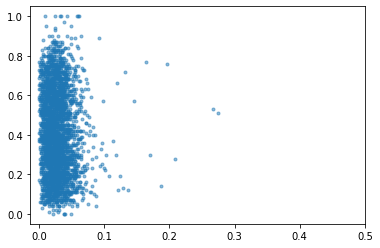

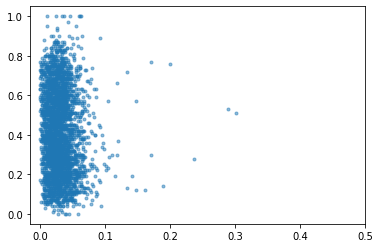

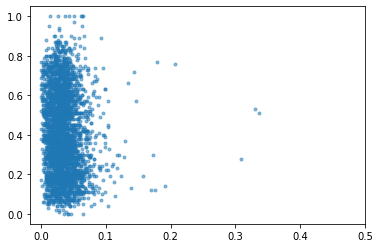

In [ ]:
#comparing two variables on a weekly basis
days = hosp_daily.date_num.max()
for i in range(100,days,7):
  data = hosp_daily[hosp_daily.date_num==i]
  plt.plot(data.infect_rate,data.hosp_occ_rate, '.',alpha=.5)
  ax = plt.gca()
  #ax.set_yscale('log') 
  plt.xlim(right=0.5)
  plt.show()

Infection rate to death rate over time

In [ ]:
#comparing two variables on a weekly basis
days = hosp_daily.date_num.max()
for i in range(100,days,7):
  data = hosp_daily[hosp_daily.date_num==i]
  plt.plot(data.infect_rate,data.death_rate, '.',alpha=.5)
  ax = plt.gca()
  #ax.set_yscale('log') 
  plt.xlim(right=0.5)
  plt.show()

##Infection Rate in Counties with Highest and Lowest Cumulative Infection Rates


We have a LOT of data and over 3000 counties. In order to visualize trends in rolling infections meaningfully, it is best to look at the counties with the highest and lowest case totals per person. Below, we add a column which calculates the cumulative infection rate and finds the counties with the top 20 and bottom 20 cumulative infection rate. This is equal to the total number of cases over total population.

In [ ]:
# Create a copy dataframe and produce a unique county, state identifier
data_copy = hosp_daily.copy()
data_copy["state_county"] = data_copy["state"] + data_copy["county"]

In [ ]:
# Create a new columnfor the cumulative infection rate 
data_copy['cum_infect_rate'] = data_copy.groupby(['county', 'state'])['infect_rate'].apply(lambda x: x.cumsum())
max_date = data_copy['date_num'].max()
# Sort by the highest and lowest cumulative infection rates on the last day we have data
top_infect = data_copy[data_copy['date_num']==max_date].sort_values(by=['cum_infect_rate'],ascending=False)
top_counties = top_infect[0:20]['state_county']
low_infect = data_copy[data_copy['date_num']==max_date].sort_values(by=['cum_infect_rate'],ascending=True)
low_counties = low_infect[0:20]['state_county']

In [ ]:
# Create data frame with all columns for these unique counties
top_infect_data = data_copy[data_copy['state_county'].isin(top_counties)]
low_infect_data = data_copy[data_copy['state_county'].isin(low_counties)]

Text(0.5, 1.0, 'Rolling 14-day infection rate for the counties with the highest cumulative infection rate')

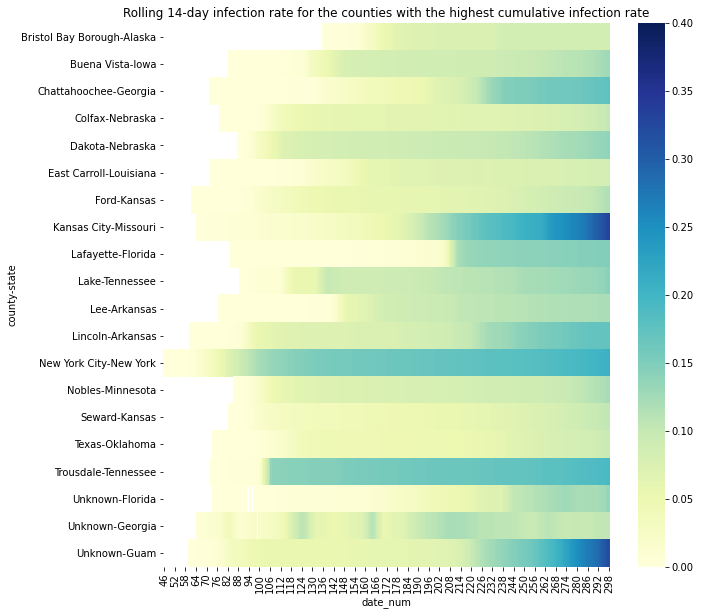

In [ ]:
heatmap1_data = pd.pivot_table(top_infect_data, values='rolling_infect_mean', 
                     index=['county','state'], 
                     columns=['date_num'])
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(heatmap1_data, cmap="YlGnBu", vmin=0, vmax=0.4)
plt.title('Rolling 14-day infection rate for the counties with the highest cumulative infection rate')

Here, we can we a variety of trends in places with the highest cumulative infection rate. Some places, like New York City, NY, have consistently had high rolling infection rates. Whereas other places, like Kansas City, Missouri, had low cases that got much higher about 4 months ago.

Text(0.5, 1.0, 'Rolling 14-day infection rate for the counties with the lowest cumulative infection rate')

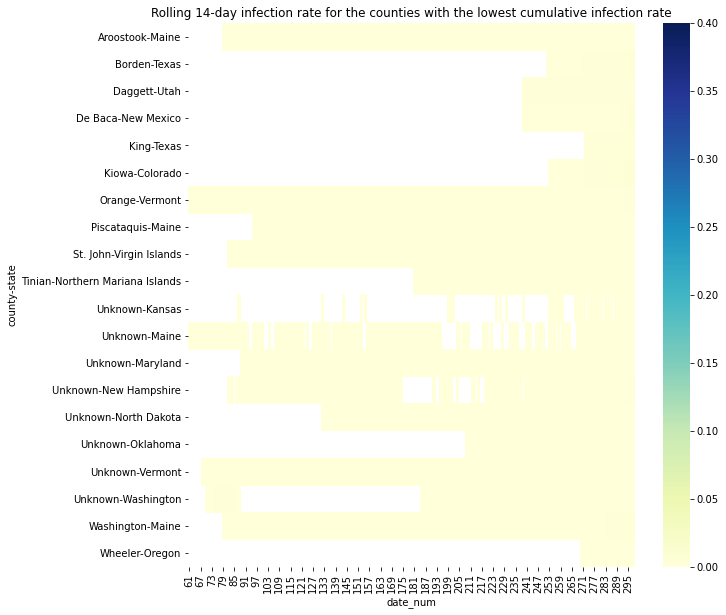

In [ ]:
heatmap1_data = pd.pivot_table(low_infect_data, values='rolling_infect_mean', 
                     index=['county','state'], 
                     columns=['date_num'])
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(heatmap1_data, cmap="YlGnBu", vmin=0, vmax=0.4)
plt.title('Rolling 14-day infection rate for the counties with the lowest cumulative infection rate')

Looking at this on the same scale, there is not much to note here, except that even counties with the lowest cumulative infection rate began seeing an uptick in cases in fall 2020. 


## Animation Maps of Daily Confirmed Cases and Fatality at State Level

The animation map is a powerful tool to illustrate how the pandemic developed over time. The following maps were generate using package **Plotly**, inspiring by this [blog post](https://towardsdatascience.com/interactive-covid-19-visualizations-using-plotly-with-4-lines-of-code-fa33b334ab84).

**Cases Animation**: Daily confirmed cases shows strong spatial pattern. From March to November, the first outbreak was in New York. Since July, California, Texas and Florida witnessed huge spikes, exceeding New York and became the new hot spots.

**Deaths Animation**: Daily fatality data shows strong spatial pattern. From March to November, the COVID death has been clustering in New York, following up by California, Texas and Florida since August.

Note: Daily cases and fatality were visualized at state level instead of county level due to the limitation of RAM.

In [ ]:
covid_v['date'] = pd.to_datetime(covid_v['date'],format="%m/%d/%Y")
covid_v = covid_v[covid_v['date'] >= '2020-03-15']
covid_v['deaths'] = pd.to_numeric(covid_v['deaths'])

# aggregate state level data (group by state and date)
covid_state = covid_v.groupby(['state','date'])['cases','deaths'].sum().reset_index()

# convert date to str format as required by plotly package
covid_state['date2'] = covid_state['date'].apply(lambda x: str(x))

covid_state.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,state,date,cases,deaths,date2
0,Alabama,2020-03-15,23,0.0,2020-03-15 00:00:00
1,Alabama,2020-03-16,29,0.0,2020-03-16 00:00:00
2,Alabama,2020-03-17,39,0.0,2020-03-17 00:00:00
3,Alabama,2020-03-18,51,0.0,2020-03-18 00:00:00
4,Alabama,2020-03-19,78,0.0,2020-03-19 00:00:00


In [ ]:
with urlopen('https://opendata.arcgis.com/datasets/48f9af87daa241c4b267c5931ad3b226_0.geojson') as response:
    counties = json.load(response)

In [ ]:
us_state_abbrev = {
    'Alabama': 'AL', 'Alaska': 'AK', 'American Samoa': 'AS', 'Arizona': 'AZ','Arkansas': 'AR','California': 'CA','Colorado': 'CO','Connecticut': 'CT',
    'Delaware': 'DE','District of Columbia': 'DC','Florida': 'FL','Georgia': 'GA','Guam': 'GU','Hawaii': 'HI','Idaho': 'ID','Illinois': 'IL', 'Indiana': 'IN',
    'Iowa': 'IA','Kansas': 'KS','Kentucky': 'KY','Louisiana': 'LA','Maine': 'ME','Maryland': 'MD','Massachusetts': 'MA', 'Michigan': 'MI','Minnesota': 'MN',
    'Mississippi': 'MS', 'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE','Nevada': 'NV', 'New Hampshire': 'NH', 'New Jersey': 'NJ', 'New Mexico': 'NM',
    'New York': 'NY','North Carolina': 'NC', 'North Dakota': 'ND', 'Northern Mariana Islands':'MP', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR',
    'Pennsylvania': 'PA','Puerto Rico': 'PR', 'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT','Virgin Islands': 'VI', 'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

covid_state['state_code'] = covid_state['state'].map(us_state_abbrev)

In [ ]:
covid_state.sort_values(by=['date2'])
fig = px.choropleth(covid_state, locations='state_code', color='cases',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           hover_name = 'state_code',
                           locationmode = 'USA-states',
                           animation_frame="date2",
                          )
fig.update_layout(
    title_text = 'Daily Confirmed Cases by State', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)
fig.show()  # Output the plot to the screen

In [ ]:
covid_state.sort_values(by=['date2'])
fig = px.choropleth(covid_state, locations='state_code', color='deaths',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           hover_name = 'state_code',
                           locationmode = 'USA-states',
                           animation_frame="date2",
                          )
fig.update_layout(
    title_text = 'Daily Fatality by State', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)
fig.show()  # Output the plot to the screen

## Graduate Color Map of Demographic Features at County Level
 
To capture geographic trends, the static demographic features were visualized through graduate color maps, inspired by this [blog post](https://towardsdatascience.com/an-introduction-to-geographical-data-visualization-3486959cd4b8).
 
**Map 1 - Population Density**: The population density shows a strong spatial pattern across the states. East US as well as west coast have higher population density compared to the middle region.
 
**Map 2 - Elder Percentage**: The percentage of elder people varies by county, but there is no clear pattern of significant high/low elder percentage in a specific region.
 
**Map 3 - Insurance Rate**: Insurance rates generally rage from 50% to 95+%. From the map we can see that the middle-east has lower insurance coverage, while the rest of the US has an insurance coverage rate around 90%.





In [ ]:
import plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
import numpy as np
import pandas as pd
import plotly.express as px

In [ ]:
## practice
ACS['FIPS2'] = ACS['FIPS'].astype(str)
#convert FIPS from a float to a string 
FIPS2 = []
for value in ACS['FIPS2']:
    FIPS2.append(value.replace(".0",""))
ACS['FIPS2'] = FIPS2
#remove trailing zeros
ACS['FIPS2'] = ACS['FIPS2'].apply(lambda x: '{0:0>5}'.format(x))
#add leading zeros for FIPS with length less than 5

In [ ]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

In [ ]:
# population density
# color_continuous_scale=”fall”,
fig = px.choropleth(ACS, geojson=counties, locations ='FIPS2', color='pop_den', color_continuous_scale="Viridis", range_color=(0,300), title = "Total Weekly Cases by Counties", scope="usa", labels={'Population Density':'Number of People per '}, hover_data=["state", "county", "FIPS"])
fig.update_layout(title_text = 'Uninsured Americans By County', margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
# elder percentage
# color_continuous_scale=”fall”,
fig = px.choropleth(ACS, geojson=counties, locations ='FIPS2', color='elder_per', color_continuous_scale="Viridis", range_color=(0,45), title = "Total Weekly Cases by Counties", scope="usa", labels={'Elder Percentage':'Percentage of Elder People'}, hover_data=["state", "county", "FIPS"])
fig.update_layout(title_text = 'Uninsured Americans By County', margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
# ins_rate
# color_continuous_scale=”fall”,
fig = px.choropleth(ACS, geojson=counties, locations ='FIPS2', color='ins_rate', color_continuous_scale="fall", range_color=(50,100), title = "Total Weekly Cases by Counties", scope="usa", labels={'Elder Percentage':'Percentage of Elder People'}, hover_data=["state", "county", "FIPS"])
fig.update_layout(title_text = 'Uninsured Americans By County', margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Part 3 - Machine Learning Models

### Reasoning About Models



Before training any modeling, the dataset was divided into three subsets:

*   Training Set 60%
*   Validation Set 20%
*   Test Set 20%

The 20% test set was not used until the end to compare the models.

We wanted to use regression models that made few assumptions and could be reasonably well understood by decision-makers. Linear regression offers baseline metrics of how much variation in future infection rates our features explain and is very easily understood. 

Ensemble models, including random forest regression and gradient boosted tree regression are very effective, tend to prevent overfitting, and make very few assumptions about the functional form of the data. 


### Spark Setup


In [ ]:
!apt install libkrb5-dev
!wget https://www-us.apache.org/dist/spark/spark-2.4.5/spark-2.4.5-bin-hadoop2.7.tgz
!tar xf spark-2.4.5-bin-hadoop2.7.tgz
!pip install findspark
!pip install sparkmagic
!pip install pyspark
!pip install pyspark --user
!pip install seaborn --user
!pip install plotly --user
!pip install imageio --user
!pip install folium --user

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libkrb5-dev is already the newest version (1.16-2ubuntu0.2).
0 upgraded, 0 newly installed, 0 to remove and 47 not upgraded.
--2020-12-16 02:45:06--  https://www-us.apache.org/dist/spark/spark-2.4.5/spark-2.4.5-bin-hadoop2.7.tgz
Resolving www-us.apache.org (www-us.apache.org)... 40.79.78.1
Connecting to www-us.apache.org (www-us.apache.org)|40.79.78.1|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://downloads.apache.org/spark/spark-2.4.5/spark-2.4.5-bin-hadoop2.7.tgz [following]
--2020-12-16 02:45:06--  https://downloads.apache.org/spark/spark-2.4.5/spark-2.4.5-bin-hadoop2.7.tgz
Resolving downloads.apache.org (downloads.apache.org)... 88.99.95.219, 2a01:4f8:10a:201a::2
Connecting to downloads.apache.org (downloads.apache.org)|88.99.95.219|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2020-12-16 02:45:07 ERROR 404: Not Found.

t

In [ ]:
%%capture
!apt update
!apt install gcc python-dev libkrb5-dev
!pip install sparkmagic

In [ ]:
%%capture
%load_ext sparkmagic.magics 

In [ ]:
%spark delete -s spark_session

In [ ]:
%spark add -s spark_session -l python -u http://ec2-100-24-33-75.compute-1.amazonaws.com:8998

Starting Spark application


ID,YARN Application ID,Kind,State,Spark UI,Driver log,Current session?
1,application_1608085282548_0003,pyspark,idle,Link,Link,✔


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

SparkSession available as 'spark'.


In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pyspark.sql.functions as F

import os

spark = SparkSession.builder.appName('ml-project').getOrCreate()

In [ ]:
#graph section
import networkx as nx
# SQLite RDBMS
import sqlite3
# Parallel processing
# import swifter
import pandas as pd
# NoSQL DB
from pymongo import MongoClient
from pymongo.errors import DuplicateKeyError, OperationFailure
import os

os.environ['SPARK_HOME'] = '/content/spark-2.4.5-bin-hadoop2.7'
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
import pyspark
from pyspark.sql import SQLContext

In [ ]:
try:
    if(spark == None):
        spark = SparkSession.builder.appName('Initial').getOrCreate()
        sqlContext=SQLContext(spark)
except NameError:
    spark = SparkSession.builder.appName('Initial').getOrCreate()
    sqlContext=SQLContext(spark)

In [ ]:
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml import Pipeline
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml.regression import GBTRegressor
from sklearn.model_selection import GridSearchCV

### Spark Data Frame Processing

Below, the CSV is loaded and processed as a Spark dataframe. Columns that were used to engineer features and labels are dropped from our feature set. "Cols" includes all features used in models. The features are vectorized and run through a pipeline and the data is split into training, testing, and validation sets.


In [ ]:
from google.colab import drive
drive.mount('drive')

Drive already mounted at drive; to attempt to forcibly remount, call drive.mount("drive", force_remount=True).


In [ ]:
import pandas as pd
df = pd.read_csv('drive/My Drive/covid.csv')

In [ ]:
sdf = spark.createDataFrame(df)
sdf.show(5)

+----------+----------+-------+-------+-----+------+-------+--------+-----------------+------------------+----------------+------------------+------------------+-----------------+----------+-----------------+----------------+-----------------+-----+--------+-------+----------+--------------------+--------------------+--------+--------------------+--------------------+-------------------------+------------------------+-------+-----------+------------------+---------+-------------+--------------------+
|Unnamed: 0|      date| county|  state|cases|deaths|tot_pop| pop_den|        young_per|         elder_per|       white_per|         black_per|avg_household_size|         edu_bach|med_income|    unemploy_rate|        ins_rate|     pub_ins_rate|tempC|reg_mask|reg_bar|reg_school|         infect_rate|          death_rate|date_num| rolling_infect_mean|  rolling_death_mean|2week_infect_rate_predict|2week_death_rate_predict|nh_beds|nh_occ_beds|       nh_occ_rate|hosp_beds|hosp_occ_rate|     beds_

In [ ]:
sdf.printSchema()

root
 |-- Unnamed: 0: long (nullable = true)
 |-- date: string (nullable = true)
 |-- county: string (nullable = true)
 |-- state: string (nullable = true)
 |-- cases: long (nullable = true)
 |-- deaths: double (nullable = true)
 |-- tot_pop: double (nullable = true)
 |-- pop_den: double (nullable = true)
 |-- young_per: double (nullable = true)
 |-- elder_per: double (nullable = true)
 |-- white_per: double (nullable = true)
 |-- black_per: double (nullable = true)
 |-- avg_household_size: double (nullable = true)
 |-- edu_bach: double (nullable = true)
 |-- med_income: double (nullable = true)
 |-- unemploy_rate: double (nullable = true)
 |-- ins_rate: double (nullable = true)
 |-- pub_ins_rate: double (nullable = true)
 |-- tempC: double (nullable = true)
 |-- reg_mask: double (nullable = true)
 |-- reg_bar: double (nullable = true)
 |-- reg_school: double (nullable = true)
 |-- infect_rate: double (nullable = true)
 |-- death_rate: double (nullable = true)
 |-- date_num: long (null

In [ ]:
sdf.columns

['Unnamed: 0',
 'date',
 'county',
 'state',
 'cases',
 'deaths',
 'tot_pop',
 'pop_den',
 'young_per',
 'elder_per',
 'white_per',
 'black_per',
 'avg_household_size',
 'edu_bach',
 'med_income',
 'unemploy_rate',
 'ins_rate',
 'pub_ins_rate',
 'tempC',
 'reg_mask',
 'reg_bar',
 'reg_school',
 'infect_rate',
 'death_rate',
 'date_num',
 'rolling_infect_mean',
 'rolling_death_mean',
 '2week_infect_rate_predict',
 '2week_death_rate_predict',
 'nh_beds',
 'nh_occ_beds',
 'nh_occ_rate',
 'hosp_beds',
 'hosp_occ_rate',
 'beds_per_person']

In [ ]:
drop_columns = ['Unnamed: 0','date','county','state','cases','deaths','date_num',\
                '2week_infect_rate_predict','2week_death_rate_predict',\
                'infect_rate','death_rate']
all_columns = ['Unnamed: 0',
 'date',
 'county',
 'state',
 'cases',
 'deaths',
 'tot_pop',
 'pop_den',
 'young_per',
 'elder_per',
 'white_per',
 'black_per',
 'avg_household_size',
 'edu_bach',
 'med_income',
 'unemploy_rate',
 'ins_rate',
 'pub_ins_rate',
 'tempC',
 'reg_mask',
 'reg_bar',
 'reg_school',
 'infect_rate',
 'death_rate',
 'date_num',
 'rolling_infect_mean',
 'rolling_death_mean',
 '2week_infect_rate_predict',
 '2week_death_rate_predict',
 'nh_beds',
 'nh_occ_beds',
 'nh_occ_rate',
 'hosp_beds',
 'hosp_occ_rate',
 'beds_per_person']
cols = [i for i in all_columns if i not in drop_columns]

In [ ]:
cols

['tot_pop',
 'pop_den',
 'young_per',
 'elder_per',
 'white_per',
 'black_per',
 'avg_household_size',
 'edu_bach',
 'med_income',
 'unemploy_rate',
 'ins_rate',
 'pub_ins_rate',
 'tempC',
 'reg_mask',
 'reg_bar',
 'reg_school',
 'rolling_infect_mean',
 'rolling_death_mean',
 'nh_beds',
 'nh_occ_beds',
 'nh_occ_rate',
 'hosp_beds',
 'hosp_occ_rate',
 'beds_per_person']

In [ ]:
assembler = VectorAssembler(
            inputCols=cols, outputCol='features')

In [ ]:
pipeline = Pipeline(stages=[assembler])
modified_sdf = pipeline.fit(sdf).transform(sdf)

In [ ]:
train_sdf, other_sdf = modified_sdf.randomSplit([0.6, 0.4])
val_sdf, test_sdf = other_sdf.randomSplit([0.5, 0.5])

##Predicting 14-Day Infection Rate

Here, we predict the infection rate 14 days in the future.

###Linear Regression

In [ ]:
lr = LinearRegression(featuresCol='features', labelCol='2week_infect_rate_predict')
lr_model = lr.fit(train_sdf)

In [ ]:
lr_train_pred = lr_model.transform(train_sdf)
lr_val_pred = lr_model.transform(val_sdf)

eval_rmse = RegressionEvaluator(metricName="rmse",labelCol="2week_infect_rate_predict",predictionCol="prediction")
eval_r2 = RegressionEvaluator(metricName="r2",labelCol="2week_infect_rate_predict",predictionCol="prediction")

In [ ]:
lr_train_rmse = eval_rmse.evaluate(lr_train_pred)
lr_val_rmse = eval_rmse.evaluate(lr_val_pred)

print("Linear Regression RMSE on training set:")
print(lr_train_rmse)
print("Linear Regression RMSE on validation set:")
print(lr_val_rmse)

Linear Regression RMSE on training set:
0.00437977482048129
Linear Regression RMSE on validation set:
0.004227254571765039


In [ ]:
lr_train_r2 = eval_r2.evaluate(lr_train_pred)
lr_val_r2 = eval_r2.evaluate(lr_val_pred)

print("Linear Regression R2 on training set:")
print(lr_train_r2)
print("Linear Regression R2 on validation set:")
print(lr_val_r2)

Linear Regression R2 on training set:
0.9401673136321621
Linear Regression R2 on validation set:
0.9446162847337944


###Random Forest Regression

In [ ]:
rf = RandomForestRegressor(featuresCol='features', labelCol='2week_infect_rate_predict', numTrees=10, maxDepth=10)
rf_model = rf.fit(train_sdf)

In [ ]:
rf_train_pred = rf_model.transform(train_sdf)
rf_val_pred = rf_model.transform(val_sdf)

In [ ]:
rf_train_rmse = eval_rmse.evaluate(rf_train_pred)
rf_val_rmse = eval_rmse.evaluate(rf_val_pred)

print("Random Forest Regression RMSE on training set:")
print(rf_train_rmse)
print("Random Forest Regression RMSE on validation set:")
print(rf_val_rmse)

Random Forest Regression RMSE on training set:
0.003931171719470392
Random Forest Regression RMSE on validation set:
0.004046712538185714


In [ ]:
rf_train_r2 = eval_r2.evaluate(rf_train_pred)
rf_val_r2 = eval_r2.evaluate(rf_val_pred)

print("Random Forest Regression R2 on training set:")
print(rf_train_r2)
print("Random Forest Regression R2 on validation set:")
print(rf_val_r2)

Random Forest Regression R2 on training set:
0.9517964562684016
Random Forest Regression R2 on validation set:
0.94924603324796


### Gradient Boosted Tree Regression

In [ ]:
gbt = GBTRegressor(featuresCol='features', labelCol='2week_infect_rate_predict')
gbt_model = gbt.fit(train_sdf)

In [ ]:
gbt_train_pred = gbt_model.transform(train_sdf)
gbt_val_pred = gbt_model.transform(val_sdf)

In [ ]:
gbt_train_rmse = eval_rmse.evaluate(gbt_train_pred)
gbt_val_rmse = eval_rmse.evaluate(gbt_val_pred)

print("Gradient Boosted Tree Regression RMSE on training set:")
print(gbt_train_rmse)
print("Gradient Boosted Tree Regression RMSE on validation set:")
print(gbt_val_rmse)

Gradient Boosted Tree Regression RMSE on training set:
0.004346430631862408
Gradient Boosted Tree Regression RMSE on validation set:
0.004452844205443252


In [ ]:
gbt_train_r2 = eval_r2.evaluate(gbt_train_pred)
gbt_val_r2 = eval_r2.evaluate(gbt_val_pred)

print("Gradient Boosted Tree Regression R2 on training set:")
print(gbt_train_r2)
print("Gradient Boosted Tree Regression R2 on validation set:")
print(gbt_val_r2)

Gradient Boosted Tree Regression R2 on training set:
0.9410748844543896
Gradient Boosted Tree Regression R2 on validation set:
0.9385473972301374


###Comparing Models

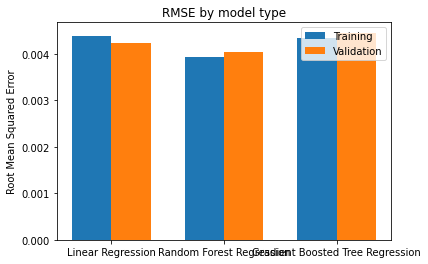

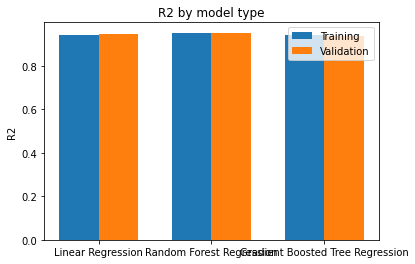

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

labels = ['Linear Regression', 'Random Forest Regression', 'Gradient Boosted Tree Regression']
rmse_train = [lr_train_rmse, rf_train_rmse, gbt_train_rmse]
rmse_val = [lr_val_rmse, rf_val_rmse, gbt_val_rmse]
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots()
bar1 = ax.bar(x - width/2, rmse_train, width, label='Training')
bar2 = ax.bar(x + width/2, rmse_val, width, label='Validation')

ax.set_ylabel('Root Mean Squared Error')
ax.set_title('RMSE by model type')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

labels = ['Linear Regression', 'Random Forest Regression', 'Gradient Boosted Tree Regression']
r2_train = [lr_train_r2, rf_train_r2, gbt_train_r2]
r2_val = [lr_val_r2, rf_val_r2, gbt_val_r2]
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots()
bar1 = ax.bar(x - width/2, r2_train, width, label='Training')
bar2 = ax.bar(x + width/2, r2_val, width, label='Validation')

ax.set_ylabel('R2')
ax.set_title('R2 by model type')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Project Challenges

> One obstacle in this project is the **accessibility** of the various components of our dataset. For example, daily weather data were not accessible through a unified data source but needed to be retrieved through an API. The retrieving process was incredibly time-consuming because data was retrieved individually at the US county-level (3000+) over the pandemic time period. 

> Another obstacle in finding the dataset is the **mixed-level** data source. The majority part of our dataset is at the county and daily level, including confirmed cases, death, and weather.  However, some predictive features, including hospital occupancy rate, number of hospital beds, nursing home occupancy rate, and number of nursing home beds, were either only accessible at the state-level or were only updated weekly. Thus, we had to make a decision about how to merge the datasets. In the end, we maintained a dataframe with daily data, so we didn't lose granularity, and filled in every day of the week with data when it was only updated weekly. 

> In performing exploratory data analysis, we found that map animation is a powerful tool to visualize the change in infection rates over time. However, the huge dataset couldn’t fit in the Plotly package. Thus, we had to display data at the state level, which compromised visualization. 

> Another challenge in exploratory data analysis was managing the huge time scale and spatial scale of our data. Producing meaningful visualizations that accounted for these two axes was difficult and required a great deal of dataframe manipulation.

> The biggest modeling challenge was considering **time dependence** in our data. While we considered autocorrelative models, such as Reccurent Neural Networks, producing valid test and validation datasets proved challenging. It was also important to balance accuracy with interpretability, so we chose models with few assumptions.



# Future Steps

> As the pandemic is developing and changing rapidly, more features should be included in the model. For example, in the foreseeable future, the public vaccination rate should be added to the regression model once the general public is able to get the vaccine. Unforeseeable factors are very likely to emerge as time goes by, we should pay close attention to media as well as academic research to incorporate potential relevant features over time.  

> There are many possible improvements for the models. Apart from more extensive hyperparameter tuning, we expect the most gains would come from adding network features that consider transmission using a graph abstraction, such as infection rate in adjacent counties or a regional average infection rate. Incorporating travel data across counties would also likely improve the model. Apart from adding in these features, we could also use an autocorrelation model that takes into account time dependence. 

> Future steps using our results would include building in data streaming capabilities, so that predicitions could automatically be sent to interested parties. If we built a consumer facing app, we would definitely need to focus on tuple-level streaming.